# Simulaciones en la escala de 0.1 m lo que corresponde a un vaso de agua.

Inicialmente hacemos una caida de un vaso de dimensiones 0.1x0.1 el cuál tiene 1/4 del fluido centrado en (0.5,0.5), eso provoca que la velocidad de las partículas al tocar la frontera inferior sea de 3.13 m/s, por lo tanto, usando la ecuación de Mach para $ Ma \leq 0.1$

$$ c = \frac{U_{max}}{Ma} = \frac{3.13}{0.1} = 31.3 m/s  $$

Lo que produce que:

$$ B = \frac{\rho_0\ c^2}{\gamma} = \frac{1000\ (31.3)^2}{7} \approx 1.4 \times 10^5 $$

Mientras que el dt estará dado por:

$$ \Delta t = min(\lambda_1 \Delta t_{CV}, \lambda_2 \Delta t_{f} ) $$

Donde:

$$ \Delta t_{CV} = min\left[ \frac{h_i}{c_i + 0.6(\alpha_{pi}\ c_i + \beta_{pi}\ max(\phi_{ij}))} \right] $$

Con:

$$ \phi_{ij} = h * \frac{v_x\ d_x + v_y\ d_y}{d_x^2 + d_y^2} $$

En este caso, tomamos:

- $ \alpha_{pi} = \beta_{pi} = 1e-2$,
- h = 2.75e-3
- dx = dy = 2.5e-3
- $v_x = 0$, $v_y = 3.13$.

Por otro lado:

$$ \Delta t_f = min\left(\frac{h_i}{f_i}\right)^{1/2} $$

Donde $f_i = 9.8$ pues está relacionado con la magnitud de la fuerza por unidad de masa (aceleración).

In [24]:
from utils.calculate_params import calculate_params

params = calculate_params(
            U_max=3.13,
            Ma = 0.1,
            rho0 = 1000,
            h = 2.75e-3,
            dx = 2.5e-3,
            dy = 2.5e-3,
            vx = 0,
            vy = 3.13,
            alpha = 1e-2,
            beta = 1e-2,
            f_accel = 9.8)

print(params)

{'c': 31.299999999999997, 'B': 139955.71428571426, 'phi_ij': 1.7215, 'dt_CV': 8.730677304674192e-05, 'dt_f': 0.016751484856512247, 'dt': 3.4922709218696766e-05}


In [25]:
from utils.create_ics import create_ics_txt
from pathlib import Path

PROJECT_ROOT = Path("/media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH")

FLUID_JSON = f"{PROJECT_ROOT}/Config/parameters/Glass10cmFall/Fluid_estGlass10cmCenter.json"
BOUND_JSON = f"{PROJECT_ROOT}/Config/parameters/Glass10cmFall/Bound_estGlass10cmCenter.json"
OUTPUT_GLASS_DIR = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab"
create_ics_txt(
    boundary_path=BOUND_JSON,
    fluid_path=FLUID_JSON,
    output_path=f"{OUTPUT_GLASS_DIR}/ics/glass10cm_center.txt",
    output_log_path=f"{OUTPUT_GLASS_DIR}/ics/glass10cm_center.log"
)


[INFO] Ejecutando main.py con rutas absolutas:
  main.py:      /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/InitialConditions/main.py
  boundary:     /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Config/parameters/Glass10cmFall/Bound_estGlass10cmCenter.json
  fluid:        /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Config/parameters/Glass10cmFall/Fluid_estGlass10cmCenter.json
  output txt:   /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt
  output log:   /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.log

[✓] Ejecución completada correctamente.



0

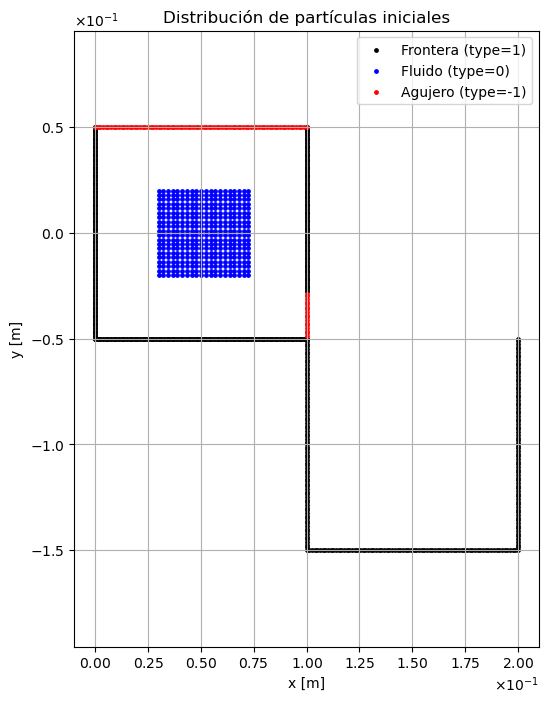

In [26]:
from utils.plot_ics import plot_ics

CENTER_GLASS_ICS = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt"

plot_ics(CENTER_GLASS_ICS)

- c: 31.3,
- B: 139955,
- phi_ij: 1.7215
- dt_CV: 8.73e-05
- dt_f: 0.0168
- dt: 3.5e-05

Probamos la estabilidad de estos parámetros calculados anteriormente haciendo uso del método de busquedad de fuerza bruta (brute_force), si resulta estable hacemos el cambio a quadtree.

In [27]:
from utils.create_simJSON import create_simulation_config

create_simulation_config(
        experiment_name="Glass10cm_05x05_center",
        input_file=CENTER_GLASS_ICS,
        base_json="AndresSimParams.json",
        B=1.4e5,
        c=31.3,
        dt=3.5e-5,
        g=-9.8,
        steps=4000,
        project_dir=f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab",
        neighbor_method="brute_force",
        project_root=PROJECT_ROOT
    )

✅ params.json generado: Glass10cm_05x05_center/params.json


PosixPath('/media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center/params.json')

In [7]:
from utils.run_sim import run_single_simulation

run_single_simulation(
    experiment_dir=PROJECT_ROOT / "Output" / "Glass10cmFallCenterEstab" / "Glass10cm_05x05_center",
    sim_executable=PROJECT_ROOT / "simulacionSinD2",
    timeout_seconds=10000
)


🚀 Ejecutando simulación: Glass10cm_05x05_center

[INFO] Leyendo parámetros desde: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center/params.json
[INFO] Configurada EoS Monaghan con parámetros:
       B=140000, c=31.3, rho0=1000, gamma=7
Dentro de función de lectura de partículas
Separación dx/dy de frontera: 0, 0
Separación dx/dy de fluido: 0, 0
Primera partícula de frontera:
  ID: 0 pos: (0, 0.05)
  tipo: Frontera
 h: 0.00275
Última partícula de fluido:
  ID: 1183 pos: (0.0725, 0.02)
  tipo: Fluido
 h: 0.00275
Se leyeron 1184 partículas desde el archivo /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt

[particleSummary] Número total de partículas: 1184
Fluido: 400, Ancho: 0.0425, Altura: 0.04
Frontera: 784, Ancho: 0.2, Altura: 0.2
[INFO] Ejecutando test del kernel...
Prueba del kernel completada.
Resultados guardados en: Output/te

KeyboardInterrupt: 

In [28]:
from utils.create_gnuplot import generar_script_gnuplot

BASE_PLOT = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center"
BASE_FILE = f"{BASE_PLOT}/Output/state_0000.txt"

generar_script_gnuplot(BASE_FILE,
                       lim=3999,
                       retardo=0.1,
                       nombre_salida="plot_est_glass10cm_20x20.gp",
                       ruta_salida=BASE_PLOT
                       )

✅ Script Gnuplot generado correctamente: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center/plot_est_glass10cm_20x20.gp
📊 Rangos consecutivos detectados por tipo:
  Tipo 1: líneas 0–223 (224 partículas)
  Tipo -1: líneas 224–321 (98 partículas)
  Tipo 1: líneas 322–783 (462 partículas)
  Tipo 0: líneas 784–1183 (400 partículas)


#### No funciona, las partículas estallan.

![Captura desde 2025-12-20 16-05-16.png](<attachment:Captura desde 2025-12-20 16-05-16.png>)
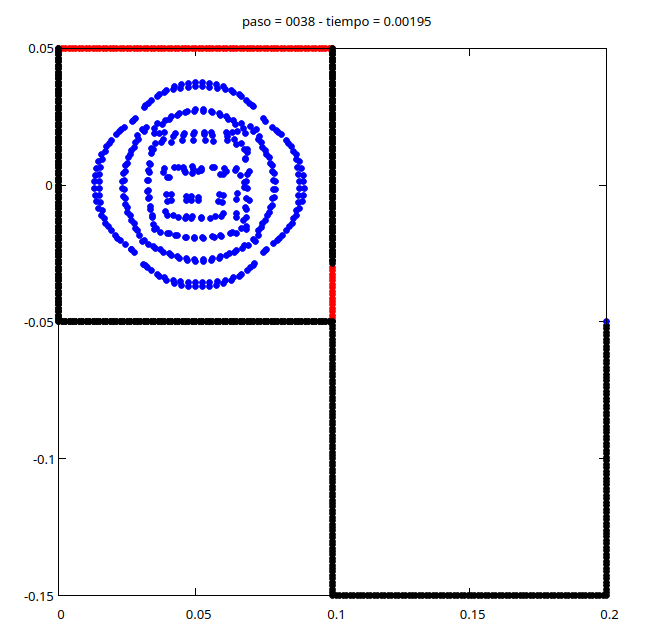

### Hagamos nuevamente la simulación con los parámetros que teníamos estables pero con un dt más rápido.

In [ ]:
from utils.create_simJSON import create_simulation_config

create_simulation_config(
        experiment_name="Glass10cm_05x05_center_B50",
        input_file=CENTER_GLASS_ICS,
        base_json="AndresSimParams.json",
        B=50,
        c=1e-2,
        dt=1e-4,
        g=-9.8,
        steps=10000,
        project_dir=f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab",
        neighbor_method="quadtree",
        project_root=PROJECT_ROOT
    )

✅ params.json generado: Glass10cm_05x05_center/params.json


PosixPath('/media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center/params.json')

In [35]:
from utils.run_sim import run_single_simulation

run_single_simulation(
    experiment_dir=PROJECT_ROOT / "Output" / "Glass10cmFallCenterEstab" / "Glass10cm_05x05_center_B50",
    sim_executable=PROJECT_ROOT / "simulacionSinD2",
    timeout_seconds=10000
)


🚀 Ejecutando simulación: Glass10cm_05x05_center

[INFO] Leyendo parámetros desde: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center/params.json
[INFO] Configurada EoS Monaghan con parámetros:
       B=50, c=0.01, rho0=1000, gamma=7
Dentro de función de lectura de partículas
Separación dx/dy de frontera: 0, 0
Separación dx/dy de fluido: 0, 0
Primera partícula de frontera:
  ID: 0 pos: (0, 0.05)
  tipo: Frontera
 h: 0.00275
Última partícula de fluido:
  ID: 1183 pos: (0.0725, 0.02)
  tipo: Fluido
 h: 0.00275
Se leyeron 1184 partículas desde el archivo /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt

[particleSummary] Número total de partículas: 1184
Fluido: 400, Ancho: 0.0425, Altura: 0.04
Frontera: 784, Ancho: 0.2, Altura: 0.2
[INFO] Ejecutando test del kernel...
Prueba del kernel completada.
Resultados guardados en: Output/tests/

In [55]:
from utils.create_gnuplot import generar_script_gnuplot

BASE_PLOT = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B50"
BASE_FILE = f"{BASE_PLOT}/Output/state_0000.txt"

generar_script_gnuplot(BASE_FILE,
                       lim=10000,
                       retardo=0.0001,
                       nombre_salida="plot_est_glass10cm_20x20_B50.gp",
                       ruta_salida=BASE_PLOT
                       )

✅ Script Gnuplot generado correctamente: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B50/plot_est_glass10cm_20x20_B50.gp
📊 Rangos consecutivos detectados por tipo:
  Tipo 1: líneas 0–223 (224 partículas)
  Tipo -1: líneas 224–321 (98 partículas)
  Tipo 1: líneas 322–783 (462 partículas)
  Tipo 0: líneas 784–1183 (400 partículas)


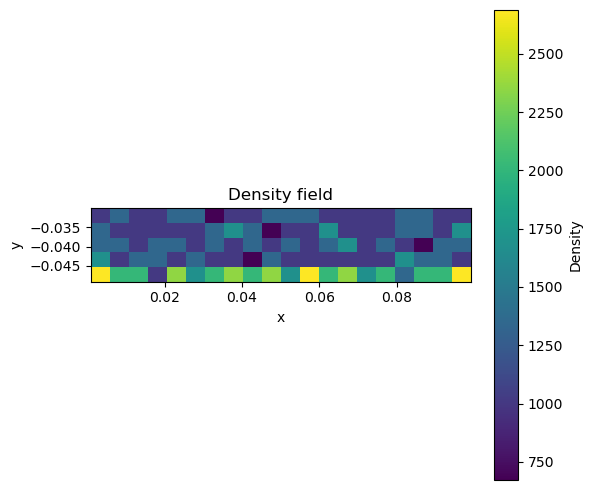

In [83]:
from utils.calculate_density_grid import density_mesh_from_file

density_array = density_mesh_from_file(f"{BASE_PLOT}/Output/state_9999.txt", mass=0.00625, Nx=20, Ny=5)

In [84]:
density_array.mean()

np.float64(1344.0216156341828)

In [85]:
print(density_array)

[[2688.04323127 2016.03242345 2016.03242345 1008.01621173 2352.03782736
  1680.02701954 2016.03242345 2352.03782736 2016.03242345 2352.03782736
  1680.02701954 2688.04323127 2016.03242345 2352.03782736 1680.02701954
  2016.03242345 1344.02161563 2016.03242345 2016.03242345 2688.04323127]
 [1680.02701954 1008.01621173 1344.02161563 1344.02161563 1008.01621173
  1344.02161563 1008.01621173 1008.01621173  672.01080782 1344.02161563
  1008.01621173 1008.01621173 1008.01621173 1008.01621173 1008.01621173
  1008.01621173 1680.02701954 1344.02161563 1344.02161563 1008.01621173]
 [1344.02161563 1344.02161563 1008.01621173 1344.02161563 1344.02161563
  1008.01621173 1344.02161563 1008.01621173 1344.02161563 1008.01621173
  1344.02161563 1008.01621173 1344.02161563 1680.02701954 1008.01621173
  1344.02161563 1008.01621173  672.01080782 1344.02161563 1344.02161563]
 [1344.02161563 1008.01621173 1008.01621173 1008.01621173 1008.01621173
  1008.01621173 1344.02161563 1680.02701954 1344.02161563  67

## Veamos ahora hasta que parámetro debemos llegar para que el promedio de la densidad en el último paso sea de 1000.

Al llegar a B = 200, c = 1e-2, nos encontramos con inestabilidades numéricas significativas pero que no rompen aún la simulación.

![Captura desde 2025-12-20 21-33-37.png](<attachment:Captura desde 2025-12-20 21-33-37.png>)
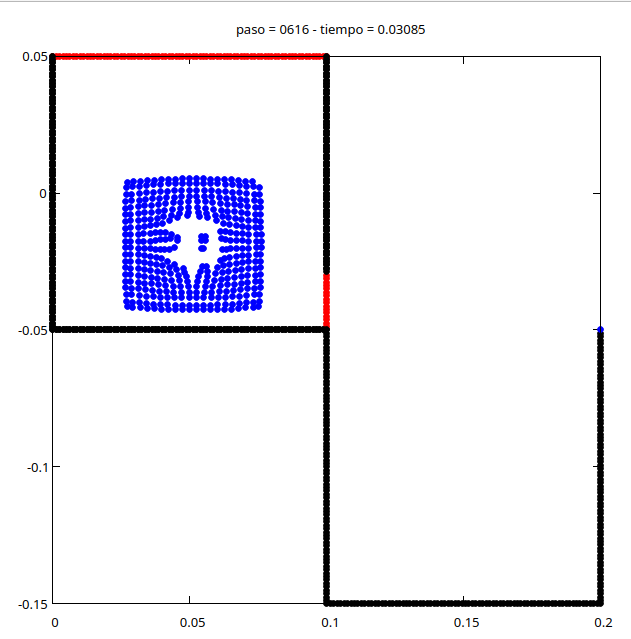

In [87]:
from utils.create_simJSON import create_simulation_config

create_simulation_config(
        experiment_name="Glass10cm_05x05_center_B100",
        input_file=CENTER_GLASS_ICS,
        base_json="AndresSimParams.json",
        B=100,
        c=1e-2,
        dt=1e-4,
        g=-9.8,
        steps=10000,
        project_dir=f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab",
        neighbor_method="quadtree",
        project_root=PROJECT_ROOT
    )

✅ params.json generado: Glass10cm_05x05_center_B100/params.json


PosixPath('/media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100/params.json')

In [45]:
from utils.run_sim import run_single_simulation

run_single_simulation(
    experiment_dir=PROJECT_ROOT / "Output" / "Glass10cmFallCenterEstab" / "Glass10cm_05x05_center_B100",
    sim_executable=PROJECT_ROOT / "simulacionSinD2",
    timeout_seconds=10000
)


🚀 Ejecutando simulación: Glass10cm_05x05_center_B100

[INFO] Leyendo parámetros desde: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100/params.json
[INFO] Configurada EoS Monaghan con parámetros:
       B=100, c=0.01, rho0=1000, gamma=7
Dentro de función de lectura de partículas
Separación dx/dy de frontera: 0, 0
Separación dx/dy de fluido: 0, 0
Primera partícula de frontera:
  ID: 0 pos: (0, 0.05)
  tipo: Frontera
 h: 0.00275
Última partícula de fluido:
  ID: 1183 pos: (0.0725, 0.02)
  tipo: Fluido
 h: 0.00275
Se leyeron 1184 partículas desde el archivo /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt

[particleSummary] Número total de partículas: 1184
Fluido: 400, Ancho: 0.0425, Altura: 0.04
Frontera: 784, Ancho: 0.2, Altura: 0.2
[INFO] Ejecutando test del kernel...
Prueba del kernel completada.
Resultados guardados en: Ou

In [88]:
from utils.create_gnuplot import generar_script_gnuplot

BASE_PLOT2 = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100"
BASE_FILE2 = f"{BASE_PLOT2}/Output/state_0000.txt"

generar_script_gnuplot(BASE_FILE2,
                       lim=10000,
                       retardo=0.0001,
                       nombre_salida="plot_est_glass10cm_20x20_B100.gp",
                       ruta_salida=BASE_PLOT2
                       )

✅ Script Gnuplot generado correctamente: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100/plot_est_glass10cm_20x20_B100.gp
📊 Rangos consecutivos detectados por tipo:
  Tipo 1: líneas 0–223 (224 partículas)
  Tipo -1: líneas 224–321 (98 partículas)
  Tipo 1: líneas 322–783 (462 partículas)
  Tipo 0: líneas 784–1183 (400 partículas)


El comportamiento para B = 1000, c = 1e-2, no presenta inestabilidades pero el comportamiento no presenta la fluides suficiente luego de esparcirse, una opción que se presentará ahora será modificar el valor de la velocidad del sonido.

![Captura desde 2025-12-20 21-44-05.png](<attachment:Captura desde 2025-12-20 21-44-05.png>)
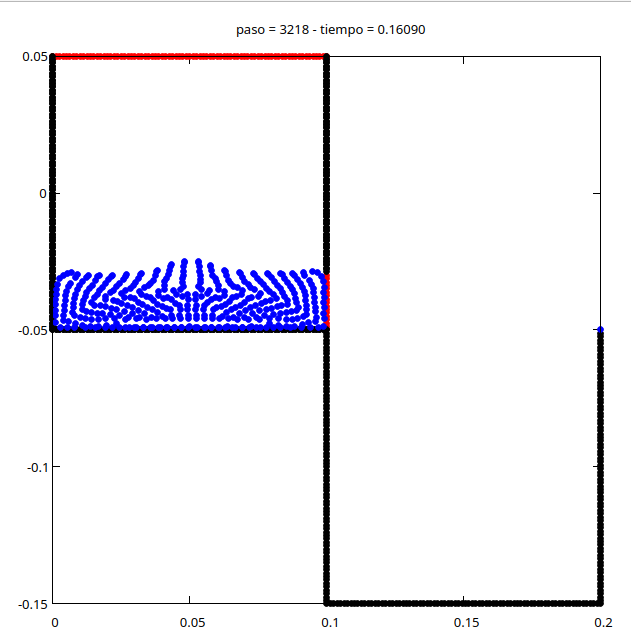

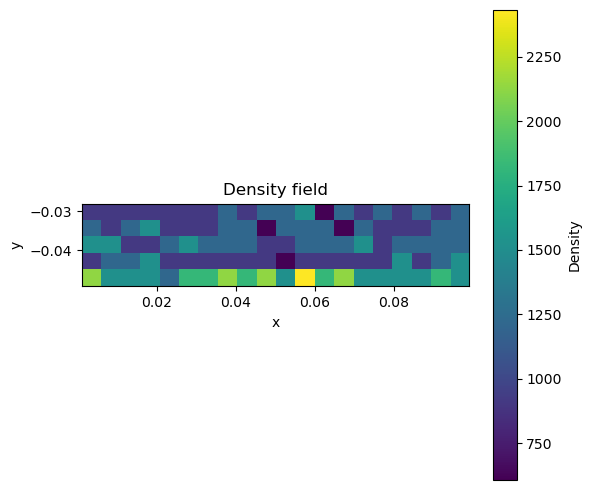

In [89]:
from utils.calculate_density_grid import density_mesh_from_file

density_array2 = density_mesh_from_file(f"{BASE_PLOT2}/Output/state_9999.txt", mass=0.00625, Nx=20, Ny=5)

In [90]:
density_array2.mean()

np.float64(1215.4535421422752)

In [91]:
print(density_array2)

[[2127.04369875 1519.31692768 1519.31692768 1519.31692768 1215.45354214
  1823.18031321 1823.18031321 2127.04369875 1823.18031321 2127.04369875
  1519.31692768 2430.90708428 1823.18031321 2127.04369875 1519.31692768
  1519.31692768 1519.31692768 1519.31692768 1823.18031321 1519.31692768]
 [ 911.59015661 1215.45354214 1215.45354214 1519.31692768  911.59015661
   911.59015661  911.59015661  911.59015661  911.59015661  911.59015661
   607.72677107  911.59015661  911.59015661  911.59015661  911.59015661
   911.59015661 1519.31692768  911.59015661 1215.45354214 1519.31692768]
 [1519.31692768 1519.31692768  911.59015661  911.59015661 1215.45354214
  1519.31692768 1215.45354214 1215.45354214 1215.45354214  911.59015661
   911.59015661 1215.45354214 1215.45354214 1215.45354214 1519.31692768
   911.59015661 1215.45354214 1215.45354214 1215.45354214 1215.45354214]
 [1215.45354214  911.59015661 1215.45354214 1519.31692768  911.59015661
   911.59015661  911.59015661 1215.45354214 1215.45354214  60

Usando la ecuación:

$$ c = \sqrt{\frac{B \gamma}{\rho_0}} $$

Tenemos que $ c \approx 0.84 $

In [92]:
from utils.create_simJSON import create_simulation_config

create_simulation_config(
        experiment_name="Glass10cm_05x05_center_B100_c084",
        input_file=CENTER_GLASS_ICS,
        base_json="AndresSimParams.json",
        B=150,
        c=0.84,
        dt=1e-4,
        g=-9.8,
        steps=10000,
        project_dir=f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab",
        neighbor_method="quadtree",
        project_root=PROJECT_ROOT
    )

✅ params.json generado: Glass10cm_05x05_center_B100_c084/params.json


PosixPath('/media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100_c084/params.json')

In [65]:
from utils.run_sim import run_single_simulation

run_single_simulation(
    experiment_dir=PROJECT_ROOT / "Output" / "Glass10cmFallCenterEstab" / "Glass10cm_05x05_center_B100_c084",
    sim_executable=PROJECT_ROOT / "simulacionSinD2",
    timeout_seconds=10000
)


🚀 Ejecutando simulación: Glass10cm_05x05_center_B100_c084

[INFO] Leyendo parámetros desde: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100_c084/params.json
[INFO] Configurada EoS Monaghan con parámetros:
       B=150, c=0.84, rho0=1000, gamma=7
Dentro de función de lectura de partículas
Separación dx/dy de frontera: 0, 0
Separación dx/dy de fluido: 0, 0
Primera partícula de frontera:
  ID: 0 pos: (0, 0.05)
  tipo: Frontera
 h: 0.00275
Última partícula de fluido:
  ID: 1183 pos: (0.0725, 0.02)
  tipo: Fluido
 h: 0.00275
Se leyeron 1184 partículas desde el archivo /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt

[particleSummary] Número total de partículas: 1184
Fluido: 400, Ancho: 0.0425, Altura: 0.04
Frontera: 784, Ancho: 0.2, Altura: 0.2
[INFO] Ejecutando test del kernel...
Prueba del kernel completada.
Resultados guarda

In [93]:
from utils.create_gnuplot import generar_script_gnuplot

BASE_PLOT3 = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100_c084"
BASE_FILE3 = f"{BASE_PLOT3}/Output/state_0000.txt"

generar_script_gnuplot(BASE_FILE3,
                       lim=10000,
                       retardo=0.0001,
                       nombre_salida="plot_est_glass10cm_20x20_c084.gp",
                       ruta_salida=BASE_PLOT3
                       )

✅ Script Gnuplot generado correctamente: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B100_c084/plot_est_glass10cm_20x20_c084.gp
📊 Rangos consecutivos detectados por tipo:
  Tipo 1: líneas 0–223 (224 partículas)
  Tipo -1: líneas 224–321 (98 partículas)
  Tipo 1: líneas 322–783 (462 partículas)
  Tipo 0: líneas 784–1183 (400 partículas)


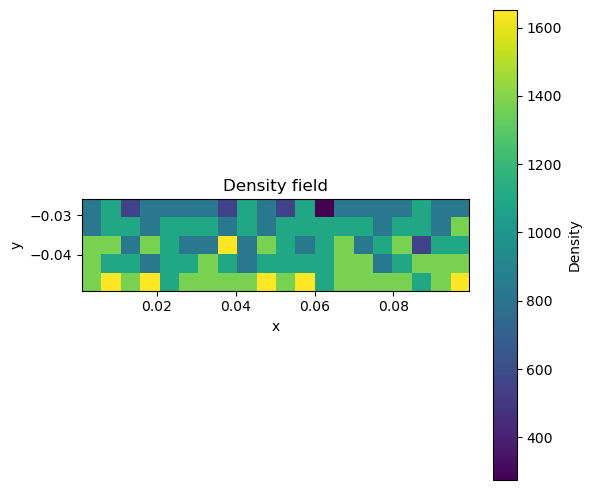

In [94]:
from utils.calculate_density_grid import density_mesh_from_file

density_array3 = density_mesh_from_file(f"{BASE_PLOT3}/Output/state_9999.txt", mass=0.00625, Nx=20, Ny=5)

In [95]:
density_array3.mean()

np.float64(1100.9696368418424)

In [96]:
print(density_array3)

[[1376.21204605 1651.45445526 1376.21204605 1651.45445526 1100.96963684
  1376.21204605 1376.21204605 1376.21204605 1376.21204605 1651.45445526
  1376.21204605 1651.45445526 1100.96963684 1376.21204605 1376.21204605
  1376.21204605 1376.21204605 1100.96963684 1376.21204605 1651.45445526]
 [1376.21204605 1100.96963684 1100.96963684  825.72722763 1100.96963684
  1100.96963684 1376.21204605 1100.96963684  825.72722763 1100.96963684
  1100.96963684 1100.96963684 1100.96963684 1376.21204605 1376.21204605
   825.72722763 1100.96963684 1376.21204605 1376.21204605 1376.21204605]
 [1376.21204605 1376.21204605  825.72722763 1376.21204605 1100.96963684
   825.72722763  825.72722763 1651.45445526  825.72722763 1376.21204605
  1100.96963684  825.72722763 1100.96963684 1376.21204605  825.72722763
  1100.96963684 1376.21204605  550.48481842 1100.96963684 1100.96963684]
 [ 825.72722763 1100.96963684 1100.96963684  825.72722763 1100.96963684
  1100.96963684 1100.96963684  825.72722763 1100.96963684  82

Aunque la densidad media, ya se encuentra muy cerca del valor requerido, el comportamiento durante la estabilización parece no se el adecuado debido a que la sección de agua que caía se separa un poco antes de golpear el piso.

![Captura desde 2025-12-20 22-36-08.png](<attachment:Captura desde 2025-12-20 22-36-08.png>)

Si hacemos que c sea 480 veces más pequeño que B, es decir, usando la misma relación que funcionaba para la escala de 1e-3 tenemos:

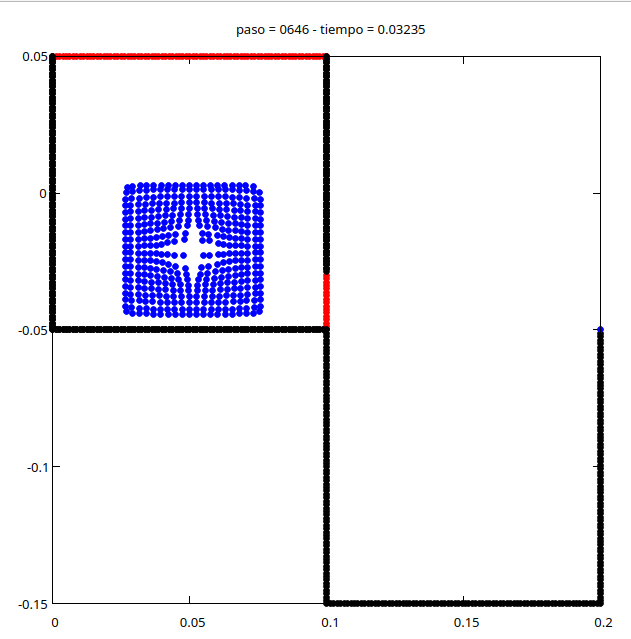

In [108]:
from utils.create_simJSON import create_simulation_config

create_simulation_config(
        experiment_name="Glass10cm_05x05_center_B150_c10",
        input_file=CENTER_GLASS_ICS,
        base_json="AndresSimParams.json",
        B=200,
        c=10,
        dt=1e-4,
        g=-9.8,
        steps=10000,
        project_dir=f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab",
        neighbor_method="quadtree",
        project_root=PROJECT_ROOT
    )

✅ params.json generado: Glass10cm_05x05_center_B150_c10/params.json


PosixPath('/media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B150_c10/params.json')

In [109]:
from utils.run_sim import run_single_simulation

run_single_simulation(
    experiment_dir=PROJECT_ROOT / "Output" / "Glass10cmFallCenterEstab" / "Glass10cm_05x05_center_B150_c10",
    sim_executable=PROJECT_ROOT / "simulacionSinD2",
    timeout_seconds=10000
)


🚀 Ejecutando simulación: Glass10cm_05x05_center_B150_c10

[INFO] Leyendo parámetros desde: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B150_c10/params.json
[INFO] Configurada EoS Monaghan con parámetros:
       B=200, c=10, rho0=1000, gamma=7
Dentro de función de lectura de partículas
Separación dx/dy de frontera: 0, 0
Separación dx/dy de fluido: 0, 0
Primera partícula de frontera:
  ID: 0 pos: (0, 0.05)
  tipo: Frontera
 h: 0.00275
Última partícula de fluido:
  ID: 1183 pos: (0.0725, 0.02)
  tipo: Fluido
 h: 0.00275
Se leyeron 1184 partículas desde el archivo /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/ics/glass10cm_center.txt

[particleSummary] Número total de partículas: 1184
Fluido: 400, Ancho: 0.0425, Altura: 0.04
Frontera: 784, Ancho: 0.2, Altura: 0.2
[INFO] Ejecutando test del kernel...
Prueba del kernel completada.
Resultados guardados 

KeyboardInterrupt: 

In [110]:
from utils.create_gnuplot import generar_script_gnuplot

BASE_PLOT4 = f"{PROJECT_ROOT}/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B150_c10"
BASE_FILE4 = f"{BASE_PLOT4}/Output/state_0000.txt"

generar_script_gnuplot(BASE_FILE4,
                       lim=10000,
                       retardo=0.0001,
                       nombre_salida="plot_est_glass10cm_20x20_c084.gp",
                       ruta_salida=BASE_PLOT4
                       )

✅ Script Gnuplot generado correctamente: /media/hvarkaed/a2e590e8-6eb4-4da7-a766-06b1247531ca/NeighboorsFloodSPH/Output/Glass10cmFallCenterEstab/Glass10cm_05x05_center_B150_c10/plot_est_glass10cm_20x20_c084.gp
📊 Rangos consecutivos detectados por tipo:
  Tipo 1: líneas 0–223 (224 partículas)
  Tipo -1: líneas 224–321 (98 partículas)
  Tipo 1: líneas 322–783 (462 partículas)
  Tipo 0: líneas 784–1183 (400 partículas)


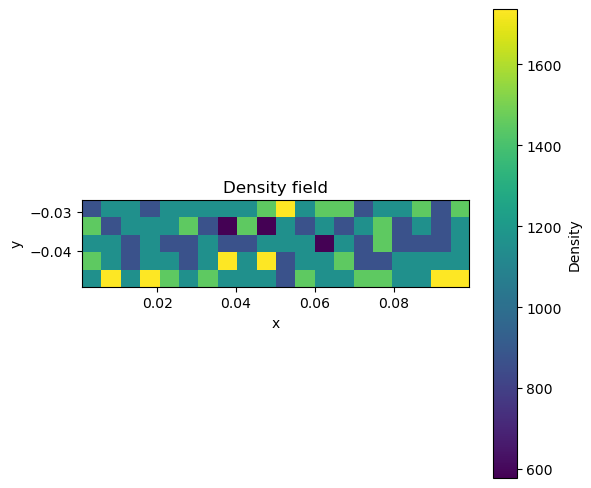

In [111]:
from utils.calculate_density_grid import density_mesh_from_file

density_array4 = density_mesh_from_file(f"{BASE_PLOT4}/Output/state_6000.txt", mass=0.00625, Nx=20, Ny=5)

In [112]:
density_array4.mean()

np.float64(1157.369503034064)

El comportamiento final parece estar más relacionado con el número de partículas y la velociadad del sonido que con un error en el parámetro B de la ecuación de estado. Por lo que se puede hacer un estudio de los parámetros B entre 50-100, y valores de c asociados, que podrían por ejemplo ser calculados con:

$$ c = \sqrt{\frac{B \gamma}{\rho_0}} $$.

Además, es necesario hacer cambios en 